In [160]:
#ENTORNO VIRTUAL:
# Version de Python 3.12.9
#Instalamos la extension de python en visual studio
#Instalamos la extension de power shell
#Preparado el entorno en Terminal (venv_tfg-- en powershell)
#En la terminal aplicando el código: python --version nos indica la version de python instalada
#Librerías instaladas: pandas, numpy scikit-learn, seaborn, mlxtend, arff 

In [161]:
#BIBLIOGRAFÍA:


In [162]:
#DESCRIPCIÓN DE VARIABLES:
##### Patient ID: Identificador único del paciente
##### Age: Edad
##### Sex: Sexo (Booleano: Male/Female)
##### Cholesterol: Colesterol
##### Blood Pressure: Tensión (Diástole/Sístole)
##### Heart Rate: Pulso
##### Diabetes: Diabetes (Booleano: 0-1)
##### Family History: Historial Familiar (Booleano: 0-1)
##### Smoking: Paciente fumador (Booleano: 0-1) 
##### Obesity: Obesidad (Booleano: 0-1)
##### Alcohol Consumption: El paciente ingiere alcohol (Booleano: 0-1)
##### Exercise Hours Per Week: Horas de ejercicio por semana
##### Diet: Tipo de dieta (Average - Unhealthy - Healthy)
    #Average = Promedio
##### Previous Heart Problems: El paciente ha tenido problemas de corazón anteriormente (Booleano: 0-1)
##### Medication Use: El paciente toma algún tipo de medicación (Booleano: 0-1)
##### Stress Level: Nivel de estrés (Escala: 1-10) Valores únicos que toma: ([ 9,  1,  6,  2,  7,  4,  5,  8, 10,  3])
##### Sedentary Hours Per Day : Horas sedentarias al día
##### Income: Ingreso anual de cada paciente expresado en la moneda local
##### BMI: Índice de masa corporal
##### Triglycerides: Trigliceridos
##### Physical Activity Days Per Week: Días de actividad física por semana
##### Sleep Hours Per Day: Horas de sueño 
##### Country: País
##### Continent: Continente
##### Hemisphere: Hemisferio
##### Heart Attack Risk: Variable objetivo (Booleano: 0-1)

#Para el caso de booleanos: 0=No, 1=Si

In [163]:
#La columna objetivo es Heart Attack Risk, que es el atributo a predecir. Usaremos esta columna para predecir la presencia de enfermedad cardíaca. 

In [164]:
#1.IMPORTE LIBRERÍAS

#Manejo de datos
import pandas as pd # data processing, CSV file
import numpy as np

#Visualización de datos
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns #statistical data visualization


# Imputador -- rellenar valores nulos
from sklearn.impute import SimpleImputer

#Preprocesamiento de los datos
from sklearn.preprocessing import LabelEncoder, StandardScaler #Categoric to Numeric

#Fichero arff
import arff

#Selección de variables
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.feature_selection import SelectKBest, chi2
from mlxtend.feature_selection import SequentialFeatureSelector as SFS

#Machine Learning (Entrenamiento/Test)
from sklearn.model_selection import train_test_split #Test/Train

#Algoritmos clasificadores
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import BaggingClassifier, AdaBoostClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline

#Métricas
from sklearn.metrics import accuracy_score, confusion_matrix

In [165]:
#2.CARGA DEL DATASET Y EDA (ANÁLISIS EXPLORATORIO DE DATOS)

In [166]:
#Mostramos el aspecto de las 5 primeras filas
data_set = pd.read_csv("heart_attack_prediction_dataset.csv")
data_set.head()

,Patient ID,Age,Sex,Cholesterol,Blood Pressure,Heart Rate,Diabetes,Family History,Smoking,Obesity,...,Sedentary Hours Per Day,Income,BMI,Triglycerides,Physical Activity Days Per Week,Sleep Hours Per Day,Country,Continent,Hemisphere,Heart Attack Risk
0,BMW7812,67,Male,208,158/88,72,0,0,1,0,...,6.615001,261404,31.251233,286,0,6,Argentina,South America,Southern Hemisphere,0
1,CZE1114,21,Male,389,165/93,98,1,1,1,1,...,4.963459,285768,27.194973,235,1,7,Canada,North America,Northern Hemisphere,0
2,BNI9906,21,Female,324,174/99,72,1,0,0,0,...,9.463426,235282,28.176571,587,4,4,France,Europe,Northern Hemisphere,0
3,JLN3497,84,Male,383,163/100,73,1,1,1,0,...,7.648981,125640,36.464704,378,3,4,Canada,North America,Northern Hemisphere,0
4,GFO8847,66,Male,318,91/88,93,1,1,1,1,...,1.514821,160555,21.809144,231,1,5,Thailand,Asia,Northern Hemisphere,0


In [167]:
#OBSERVACIONES:
#Podemos comprobar que la columna "Blood Pressure" contiene de forma única, separada por una barra, las fases del corazón:sístole y diástole.
#Sístole: fase en la que el corazón se contrae y bombea sangre
#Diástole: fase en la que el corazón se relaja y se llena de sangre.

#Vamos a tener que ajustar esta columna y dividirla en dos columnas que haga referencia a cada fase.

In [168]:
#Revisamos la columna "Blood Pressure"
data_set['Blood Pressure']

0        158/88
1        165/93
2        174/99
3       163/100
4         91/88
         ...   
8758      94/76
8759    157/102
8760     161/75
8761     119/67
8762     138/67
Name: Blood Pressure, Length: 8763, dtype: object

In [169]:
#Dividimos la columna de Blood Preasure: 
#Tenemos el dato de la forma x/y que es la presión sistólica/diastólica
#Corazón contrae - sistole
#Corazón se relaja - diastole
# Crear una copia del dataset original y dividir la columna

data_set[['Systole', 'Diastole']] = data_set['Blood Pressure'].str.split('/', expand=True).astype(float)

# Eliminar la columna original
data_set=data_set.drop(columns=['Blood Pressure'])

# Verificar el nuevo DataFrame
print(data_set.head())

  Patient ID  Age     Sex  Cholesterol  Heart Rate  Diabetes  Family History  \
0    BMW7812   67    Male          208          72         0               0   
1    CZE1114   21    Male          389          98         1               1   
2    BNI9906   21  Female          324          72         1               0   
3    JLN3497   84    Male          383          73         1               1   
4    GFO8847   66    Male          318          93         1               1   

   Smoking  Obesity  Alcohol Consumption  ...        BMI Triglycerides  \
0        1        0                    0  ...  31.251233           286   
1        1        1                    1  ...  27.194973           235   
2        0        0                    0  ...  28.176571           587   
3        1        0                    1  ...  36.464704           378   
4        1        1                    0  ...  21.809144           231   

   Physical Activity Days Per Week  Sleep Hours Per Day    Country  \
0   

In [170]:
#Resumen de tipos de datos y valores nulos: número de columnas, número de filas, conteo de registros nulos y el tipo de la varibale. 
#Localizamos globalmente el tipo de variables que se toman. En esta base contamos con float, int y object.
#Float=decimal; int=entero; object= categorico
data_set.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8763 entries, 0 to 8762
Data columns (total 27 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Patient ID                       8763 non-null   object 
 1   Age                              8763 non-null   int64  
 2   Sex                              8763 non-null   object 
 3   Cholesterol                      8763 non-null   int64  
 4   Heart Rate                       8763 non-null   int64  
 5   Diabetes                         8763 non-null   int64  
 6   Family History                   8763 non-null   int64  
 7   Smoking                          8763 non-null   int64  
 8   Obesity                          8763 non-null   int64  
 9   Alcohol Consumption              8763 non-null   int64  
 10  Exercise Hours Per Week          8763 non-null   float64
 11  Diet                             8763 non-null   object 
 12  Previous Heart Probl

In [171]:
# Dimensiones (filas, columnas)
data_set.shape

(8763, 27)

In [172]:
#Generamos estadísticas descriptivas para todas las columnas:
#count: Número total de valores no nulos en la columna.
#mean: Media aritmética de los valores.
#std: Desviación estándar, que mide la dispersión de los datos respecto a la media.
#min: Valor mínimo en la columna.
#25% (Primer cuartil, Q1): El 25% de los datos es menor o igual a este valor.
#50% (Mediana o Segundo cuartil, Q2): El 50% de los datos es menor o igual a este valor.
#75% (Tercer cuartil, Q3): El 75% de los datos es menor o igual a este valor.
#max: Valor máximo en la columna.

#Las variables categóricas se añaden al incluir (include all). Estas son:
#unique: Número de valores únicos en la columna.
#top: El valor más frecuente en la columna.
#freq: La frecuencia con la que aparece el valor más frecuente.


data_set.describe(include="all")

,Patient ID,Age,Sex,Cholesterol,Heart Rate,Diabetes,Family History,Smoking,Obesity,Alcohol Consumption,...,BMI,Triglycerides,Physical Activity Days Per Week,Sleep Hours Per Day,Country,Continent,Hemisphere,Heart Attack Risk,Systole,Diastole
count,8763,8763.000000,8763,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,...,8763.000000,8763.000000,8763.000000,8763.000000,8763,8763,8763,8763.000000,8763.000000,8763.000000
unique,8763,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,20,6,2,NaN,NaN,NaN
top,ZWN9666,NaN,Male,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,Germany,Asia,Northern Hemisphere,NaN,NaN,NaN
freq,1,NaN,6111,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,477,2543,5660,NaN,NaN,NaN
mean,NaN,53.707977,NaN,259.877211,75.021682,0.652288,0.492982,0.896839,0.501426,0.598083,...,28.891446,417.677051,3.489672,7.023508,NaN,NaN,NaN,0.358211,135.075659,85.156111
std,NaN,21.249509,NaN,80.863276,20.550948,0.476271,0.499979,0.304186,0.500026,0.490313,...,6.319181,223.748137,2.282687,1.988473,NaN,NaN,NaN,0.479502,26.349976,14.676565
min,NaN,18.000000,NaN,120.000000,40.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,18.002337,30.000000,0.000000,4.000000,NaN,NaN,NaN,0.000000,90.000000,60.000000
25%,NaN,35.000000,NaN,192.000000,57.000000,0.000000,0.000000,1.000000,0.000000,0.000000,...,23.422985,225.500000,2.000000,5.000000,NaN,NaN,NaN,0.000000,112.000000,72.000000
50%,NaN,54.000000,NaN,259.000000,75.000000,1.000000,0.000000,1.000000,1.000000,1.000000,...,28.768999,417.000000,3.000000,7.000000,NaN,NaN,NaN,0.000000,135.000000,85.000000
75%,NaN,72.000000,NaN,330.000000,93.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,34.324594,612.000000,5.000000,9.000000,NaN,NaN,NaN,1.000000,158.000000,98.000000


In [173]:
#Inspeccionamos registros de las variables categóricas

In [174]:
#OBSERVACIONES:
#Tras la carga de la siguiente celda vemos que el campo "Patient ID" tiene demasiados registros y ocupa demasiado espacio en la salida de la información,
#vamos a suprimir este campo en la evaluación de variables categóricas.

In [175]:
# Seleccionamos las variables categóricas, excluyendo 'Patient ID'
categorical_variables = data_set.select_dtypes(include=['object', 'category']).columns
categorical_variables = categorical_variables.drop('Patient ID', errors='ignore')

value_counts_dict = {}

# Contador
for variable in categorical_variables:
    value_counts_dict[variable] = data_set[variable].value_counts()

# Inicializamos una lista vacía
data_list = []

# Añadimos una tupla a la lista para cada categoría
for variable, counts in value_counts_dict.items():
    for category, count in counts.items():
        data_list.append((variable, category, count))
    # Añadimos una tupla vacía para crear un espacio entre variables
    data_list.append(("---", "---", "---"))

# Creación del data frame
value_counts_df = pd.DataFrame(data_list, columns=['Variable', 'Category', 'Count'])

# Creación del índice
value_counts_df = value_counts_df.set_index('Variable')

# Mostrar el DataFrame completo
value_counts_df

,Category,Count
Variable,,
Sex,Male,6111
Sex,Female,2652
---,---,---
Diet,Healthy,2960
Diet,Average,2912
Diet,Unhealthy,2891
---,---,---
Country,Germany,477
Country,Argentina,471


In [176]:
#OBSERVACIONES:
#Desbalance en la distribución por sexo:
#Existe un desbalance significativo en la variable 'Sex', con 6111 casos de 'Hombre' frente a 2652 de 'Mujer'. 
#Esto sugiere que el conjunto de datos representa más a pacientes hombres, lo cual podría introducir un sesgo de género en cualquier análisis o modelo predictivo.

#Desbalace en la distribución por continente: 
#Al igual que el caso anterior, observamos que hay menos casos por ejemplo de "North America" que "Asia"

#Desbalance en la distribución por hemisferio:
#Existe un desbalance significativo en la variable "Hemisphere", con 5660 casos de "Northen Hemisphere" y 3103 casos de "Southern Hemisphere"

In [177]:
#Inspeccionamos registros de variable objetivo
num_df = data_set['Heart Attack Risk'].value_counts()
pd.DataFrame(num_df)

,count
Heart Attack Risk,
0,5624
1,3139


In [178]:
#OBSERVACIONES:
#En Machine Learning y Análisis de Datos se considera desbalance cuando una clase representa menos del 30% del total. En nuestro caso para la variable objetivo, no está
#perfectamente balanceado, pero no es un desbalance severo

In [179]:
#Limpiar columnas irrelevantes
df = data_set.drop(columns=['Patient ID', 'Hemisphere', 'Continent'])

In [180]:
#Hacemos una copia hasta este paso porque luego la necesitaremos para el gráfico de pastel. 
#Queremos que, antes de pasar categóricos a numéricos, se queden registrados los valores categóricos para que visualmente sea entendible en el gráfico de pastel
df_cat=df.copy()

In [181]:
#Convertimos las columnas categóricas en numéricas
categorical_cols = df.select_dtypes(include='object').columns

label_encoders = {}
label_mappings = {}

for col in categorical_cols:
    le = LabelEncoder()
    
    # Asegurarse de que la columna sea tipo objeto
    df[col] = df[col].astype('object')
    
    # Identificar valores no nulos
    mask = df[col].notnull()
    
    # Aplicar LabelEncoder solo a valores no nulos
    df.loc[mask, col] = le.fit_transform(df.loc[mask, col])
    
    # Guardar encoder y mapping
    label_encoders[col] = le
    label_mappings[col] = dict(zip(le.classes_, le.transform(le.classes_)))

    # Convertir a int después de codificar
    df[col] = pd.to_numeric(df[col], errors='coerce')
    
print(label_mappings)

{'Sex': {'Female': np.int64(0), 'Male': np.int64(1)}, 'Diet': {'Average': np.int64(0), 'Healthy': np.int64(1), 'Unhealthy': np.int64(2)}, 'Country': {'Argentina': np.int64(0), 'Australia': np.int64(1), 'Brazil': np.int64(2), 'Canada': np.int64(3), 'China': np.int64(4), 'Colombia': np.int64(5), 'France': np.int64(6), 'Germany': np.int64(7), 'India': np.int64(8), 'Italy': np.int64(9), 'Japan': np.int64(10), 'New Zealand': np.int64(11), 'Nigeria': np.int64(12), 'South Africa': np.int64(13), 'South Korea': np.int64(14), 'Spain': np.int64(15), 'Thailand': np.int64(16), 'United Kingdom': np.int64(17), 'United States': np.int64(18), 'Vietnam': np.int64(19)}}


In [182]:
#OBSERVACIONES:
#En este punto ya tendríamos todas las columnas convertidas en numéricas

#La transformación de los datos de categóricos a numéricos es:
#Sex: 0=Female, 1=Male
#Diet: 0=Average, 1=Healthy, 2=Unhealthy
#Country: Paises con rango de 0 a 19

In [183]:
#Manejo de valores nulos

In [184]:
#Limpieza correcta de valores nulos = Imputación de valores faltantes (Relleno)

#Columnas Numéricas: Es un método de imputación que predice los valores faltantes de una columna basándose en otras columnas del DataFrame,
# usando modelos estadísticos de forma iterativa. Es más preciso que simplemente usar la media o la mediana.
#Columnas Categóricas: se utiliza la moda.
#Columnas Binarios: se utiliza la moda.

#De esta manera se mantiene estable el estudio.

In [185]:
df.isnull().sum()

Age                                0
Sex                                0
Cholesterol                        0
Heart Rate                         0
Diabetes                           0
Family History                     0
Smoking                            0
Obesity                            0
Alcohol Consumption                0
Exercise Hours Per Week            0
Diet                               0
Previous Heart Problems            0
Medication Use                     0
Stress Level                       0
Sedentary Hours Per Day            0
Income                             0
BMI                                0
Triglycerides                      0
Physical Activity Days Per Week    0
Sleep Hours Per Day                0
Country                            0
Heart Attack Risk                  0
Systole                            0
Diastole                           0
dtype: int64

In [186]:
#OBSERVACIONES:
#Tal y como podemos observar, no tenemos valores nulos que generen ruido en el análisis del dataset.

In [187]:
#Manejo de valores duplicados

In [188]:
#Comprobamos para la limpieza si hay filas completas duplicadas:
df.loc[df.duplicated()]

,Age,Sex,Cholesterol,Heart Rate,Diabetes,Family History,Smoking,Obesity,Alcohol Consumption,Exercise Hours Per Week,...,Sedentary Hours Per Day,Income,BMI,Triglycerides,Physical Activity Days Per Week,Sleep Hours Per Day,Country,Heart Attack Risk,Systole,Diastole


In [189]:
#OBSERVACIONES: 
#Tal y como podemos observar no hay filas duplicadas que generen ruido en el análisis del dataset
#En el caso de que nos hubieran salido valores duplicados, eliminamos las filas y dejamos una única.

In [190]:
#3.VISUALIZACIONES

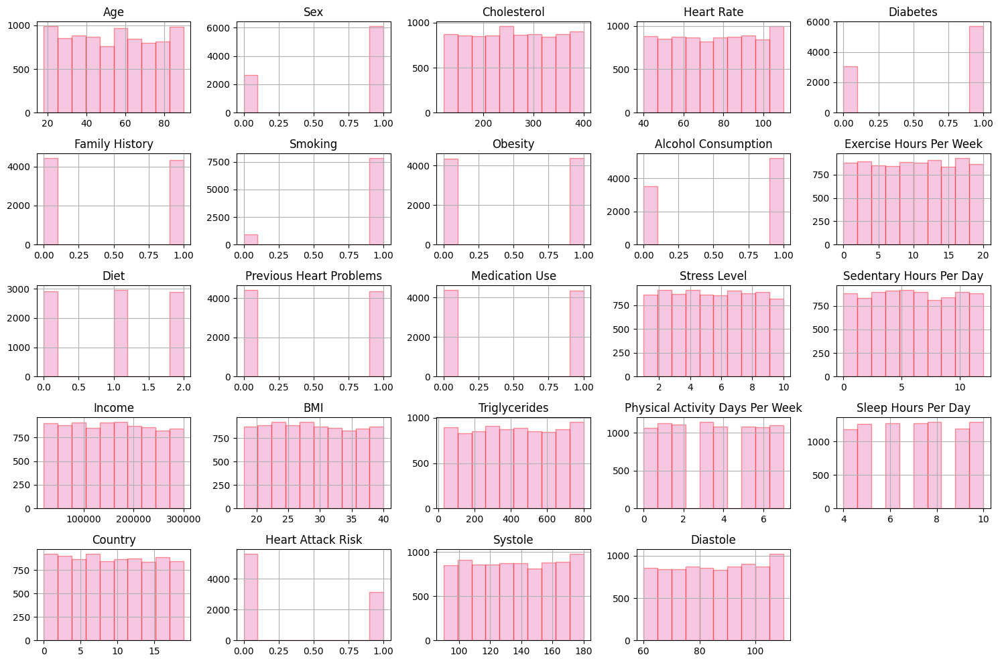

In [191]:
# Gráfico de barras para cada variable
df.hist(
    figsize=(15, 10),
    color='#E773B5',
    alpha=0.4,
    edgecolor='red'  # Borde para cada barra
)

plt.tight_layout()
plt.show()

In [192]:
#OBSERVACIONES:
#Visualmente hemos podido detectar que variables que pensabamos que tenian comportamiento binario, realmente tienen más clases. Caso: Diet
#Los campos que son categóricos como: Country o Diet no aportan en gráfico de barras una comprensión completa. Las clases son representadas en datos numéricos.
    #Para ver esto de forma adecuada vamos a utilizar gráficos de pastel.
#El campo Smoking tiene un gran desbalance de información.

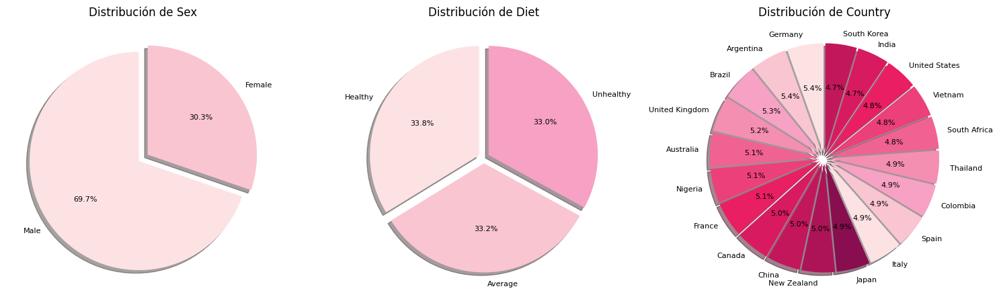

In [193]:
#Gráfico de pastel para variables categóricas
# Seleccionar columnas categóricas
categorical_cols = df_cat.select_dtypes(include='object').columns

# Determinar filas y columnas para subplots
n = len(categorical_cols)
cols = 3  # Número de columnas por fila
rows = int(np.ceil(n / cols))

# Crear figura y ejes
fig, axes = plt.subplots(rows, cols, figsize=(cols*5, rows*5))
axes = axes.flatten()  # Convertir a lista para iterar fácilmente

# Lista de colores en gama de rosa
pink_palette = [
    '#FDE2E4', '#F9C5D1', '#F7A1C4', '#F48FB1', '#F06292',
    '#EC407A', '#E91E63', '#D81B60', '#C2185B', '#AD1457',
    '#880E4F'
]

# Crear un gráfico de pastel por variable
for i, col in enumerate(categorical_cols):
    
    df_cat[col].value_counts().plot.pie(
    ax=axes[i],
    autopct='%1.1f%%',
    startangle=90,
    shadow=True,
    explode=[0.05]*df_cat[col].nunique(),
    colors=pink_palette[:df_cat[col].nunique()],  # Ajusta al número de categorías
    textprops={'fontsize': 8}  # Tamaño de letra más chico
)
    axes[i].set_title(f'Distribución de {col}')
    axes[i].set_ylabel('')

# Ocultar los ejes extra si hay más subplots que variables
for j in range(i+1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

In [194]:
#Estudio de valores atípicos

In [195]:
#Los outliers son datos que se encuentran muy alejados del resto de los valores en una distribución.
#En estos casos tenemos que hacer limpieza de estos datos que generan ruido.
#El estudio se suele contemplar para valores numéricos (aunque también se puede hacer para valores categóricos)
#Por otro lado, no se pueden considerar outliers en variables binarias (0/1) porque estas variables solo tienen dos posibles valores 
#y no hay una noción de “valor extremo” como en variables continuas

In [196]:
#Solo vamos a tomar las columnas continuas (prescindiendo de las binarias y que tiene un umbral menor que 4, que no tiene sentido estudiarlas)

# Seleccionar columnas numéricas
df_continuous = df.select_dtypes(include=['int','float'])

# Filtrar columnas que tienen más de 2 valores únicos (para evitar binarias)
df_continuous = df_continuous.loc[:, df_continuous.nunique() > 2]

# Calcular IQR
Q1 = df_continuous.quantile(0.25)
Q3 = df_continuous.quantile(0.75)
IQR = Q3 - Q1

limite_inferior = Q1 - 1.5 * IQR
limite_superior = Q3 + 1.5 * IQR

# Detección de outliers
outliers = (df_continuous < limite_inferior) | (df_continuous > limite_superior)

# Mostrar cantidad de outliers por columna continua
print("Número de outliers por columna continua:")
print(outliers.sum())

Número de outliers por columna continua:
Age                                0
Cholesterol                        0
Heart Rate                         0
Exercise Hours Per Week            0
Diet                               0
Stress Level                       0
Sedentary Hours Per Day            0
Income                             0
BMI                                0
Triglycerides                      0
Physical Activity Days Per Week    0
Sleep Hours Per Day                0
Country                            0
Systole                            0
Diastole                           0
dtype: int64


In [197]:
#OBSERVACIONES
#Hemos excluido las variables que son binarias. Hemos observado que en el caso del campo Smoking teniamos 904 casos de outliers. Tiene una distribución fuertemenete desproporcionada. 
# Esto se debe a que tal y como hemos observado en las gráficas anteriores, hay menos valores para el caso 0 = No fumador que para el caso 1 = Fumador.
#En estos casos, no tiene sentido estudiar los outliers. Son casos binarios.
#El resto de variables no tienen valores atípicos

In [198]:
#Visualización valores atípicos. Diagrama de caja (Boxplot)

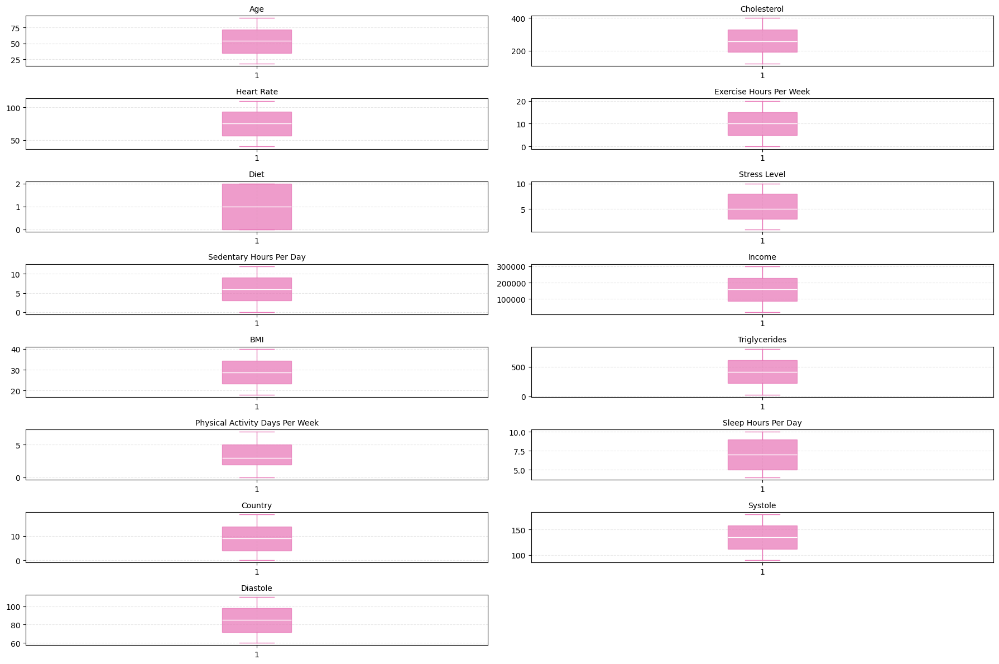

In [199]:
# Ajustamos el tamaño general del gráfico
plt.figure(figsize=(18, 12))  # Más grande
# Un boxplot por variable, distribuidos en 2 columnas por fila
for i, col in enumerate(df_continuous.columns, 1):
    plt.subplot((len(df_continuous.columns) + 1) // 2, 2, i)
    plt.boxplot(df_continuous[col].dropna(), patch_artist=True,
                boxprops=dict(facecolor='#E773B5', color='#E773B5', alpha=0.7),
                medianprops=dict(color='white'),
                whiskerprops=dict(color='#E773B5'),
                capprops=dict(color='#E773B5'),
                flierprops=dict(markerfacecolor='#E773B5', marker='o', alpha=0.5))
    plt.title(col, fontsize=10)  
    plt.grid(True, linestyle='--', alpha=0.3)

plt.tight_layout()
plt.show()

In [200]:
#OBSERVACIONES
#Tal y como hemos indicado anteriormente, no hay valores atípicos. Visualmente serían reconocidos con mayor facilidad.

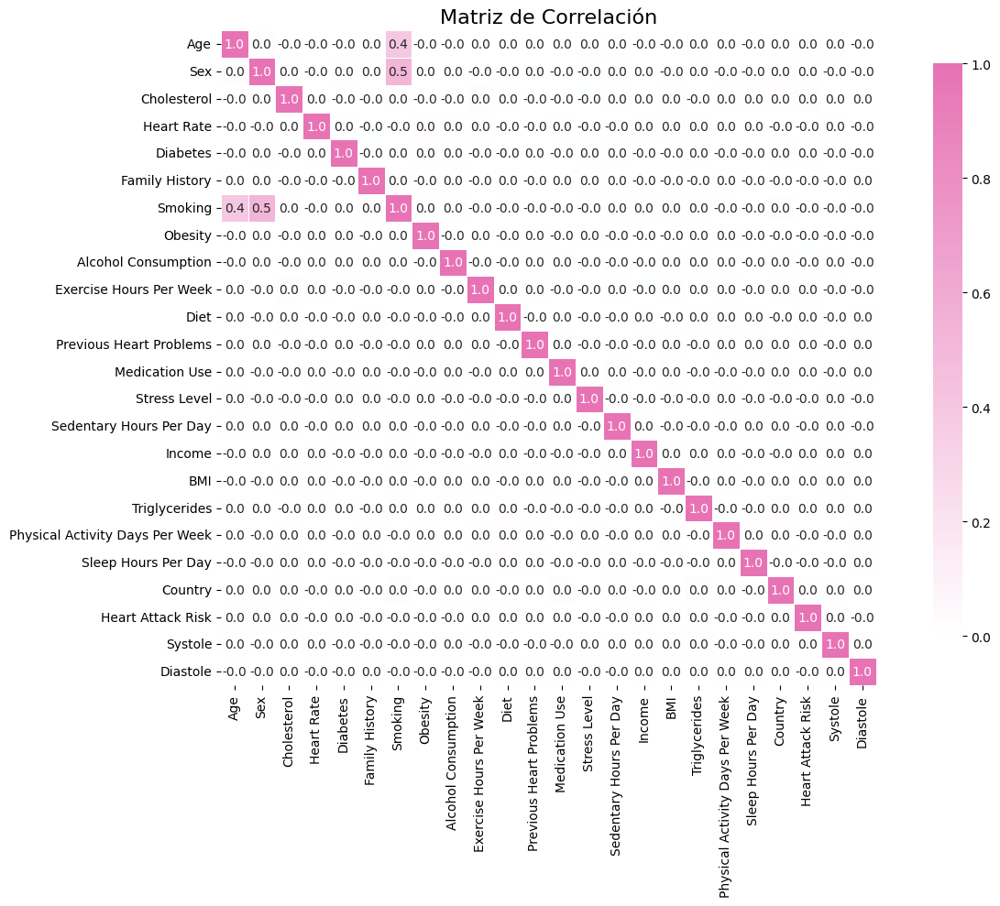

In [201]:
# Matriz de correlación
correlation_matrix = df.corr(numeric_only=True)

# Crear un colormap rosa personalizado
cmap = mcolors.LinearSegmentedColormap.from_list(
    "rose_red_dark",
    ['#E0F8F1', '#ffffff', '#E773B5'],  # suave → medio → fuerte → oscuro
    N=256
)

# Gráfico
plt.figure(figsize=(14, 10))
sns.heatmap(
    correlation_matrix,
    annot=True,
    fmt=".1f",
    cmap=cmap,
    center=0,
    square=True,
    linewidths=0.5,
    cbar_kws={"shrink": 0.90}
)
plt.title('Matriz de Correlación', fontsize=16)
plt.tight_layout()
plt.show()

In [202]:
#OBSERVACIONES:
#La matriz utilizada es la correlación de Pearson, que mide la realción lineal entre dos variables.
#Los valores van:
    #1.0 = correlación positiva perfecta (cuando una sube, la otra también lo hace en la misma proporción)
    #0 = sin correlación lineal (no significa que no haya relación, solo que no es lineal)
    #-1.0= corrlación negativa perfecta (cuando una sube, la otra baja en la misma proporción)
#En nuestra matriz de correlación observamos que:
#smoking y age junto con smoking y sex tienen una correlación positiva moderada

#Razones posibles que no inducen a correlaciones fuertes: (>0.7)
#La relación no es lienal, pues la correlación de Pearson solo detecta correlaciones lineales. Si hay una relación curva, categórica o más compleja, no se verá reflejada
#La variable num (variable objetivo) puede depender de múltiples factores combinados. Quizás ninguna variable por si sola tenga gran peso, pero en conjunto sí lo tienen(es típico en modelos de salud y medicina)
#Si algunas variables son categóricas codificadas como números puede hacer que la correlación se vea afectada
#El número de muestras es bajo
#La limpieza no es completa

#Pasos que podemos dar para comprobar la relación entre variables:
#Visualizar relaciones no lineales (gráficos como pairplot,scatterplot o árboles de decisión)
#Probar correlación de Spearman (detecta relaciones monótonas, no lineales)
#Hacemos selección de variables (usando modelos como Randomforest)

In [203]:
# Separar características y etiquetas
X = df.drop(columns='Heart Attack Risk')
y = df['Heart Attack Risk']

In [204]:
# División en entrenamiento/prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [205]:
#Selector de variables
#Tal y como hemos visto en las observaciones de la matriz de correlación, vamos a utilizar el método de selección de variables Randomforest para comprobar la relación entre variables.

In [206]:
from sklearn.ensemble import RandomForestClassifier

In [207]:
# Crear y entrenar modelo
rf = RandomForestClassifier(random_state=42)
rf.fit(X_train, y_train)
# Importancia de variables
importancias = pd.Series(rf.feature_importances_, index=X.columns).sort_values(ascending=False)
importancias

BMI                                0.079630
Income                             0.077490
Triglycerides                      0.076968
Sedentary Hours Per Day            0.076769
Exercise Hours Per Week            0.076188
Cholesterol                        0.074361
Systole                            0.068635
Heart Rate                         0.066576
Age                                0.065583
Diastole                           0.063800
Country                            0.052917
Stress Level                       0.042409
Physical Activity Days Per Week    0.038587
Sleep Hours Per Day                0.035972
Diet                               0.019602
Family History                     0.011734
Alcohol Consumption                0.011648
Obesity                            0.011517
Previous Heart Problems            0.011469
Medication Use                     0.011042
Diabetes                           0.010807
Sex                                0.010425
Smoking                         

In [208]:
#OBSERVACIONES:
# Los números que han salido de cada variable representan el peso o contribución relativa de cada variable a la hora de hacer predicciones.
#No están en escala absoluta (de 0 a 1). Entre todas ellas suman 1 y cuanto más alto, más útil es la variable para el modelo.
#Tal y como podemos mostrar en nuestro caso, por el método de selección de variables las variables con mayor importancia son ['BMI', 'Sedentary Hours Per Day', 'Exercise Hours Per Week', 'Income', 'Triglycerides', 'Cholesterol', 'Systole', 'Age', 'Heart Rate' , 'Diastole', 'Heart Attack Risk']
# Podemos sacar como conclusión que la correlación no es identificador de la importancia predictiva en el modelo

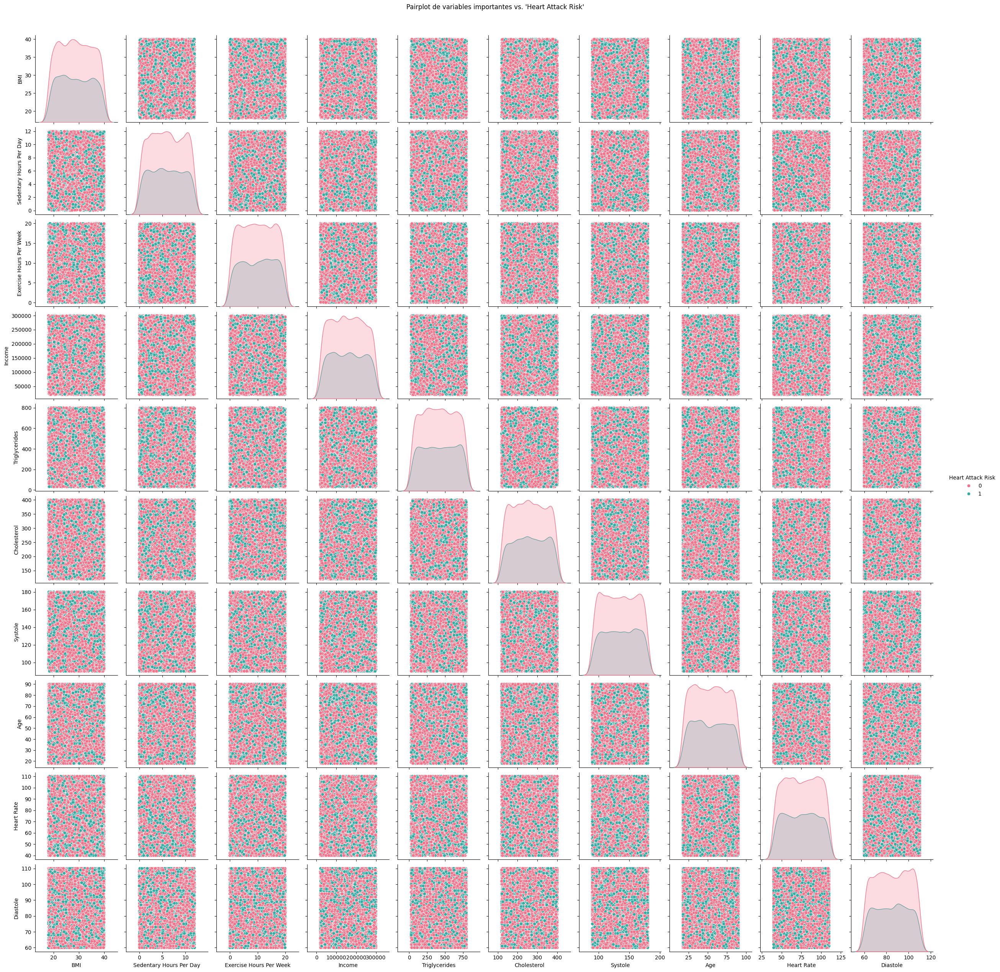

In [209]:
#Método "Pairplot" Modelo no lineal
#Vamos a visualizar las variables más importante detectadas anteriormente con Randomforest a través de las gráficas pairplot (para detectar relaciones no lineales)
# Seleccionamos las variables más importantes según Random Forest
variables_interes = ['BMI', 'Sedentary Hours Per Day', 'Exercise Hours Per Week', 'Income', 'Triglycerides', 'Cholesterol', 'Systole', 'Age', 'Heart Rate' , 'Diastole', 'Heart Attack Risk']
sns.pairplot(df[variables_interes], hue='Heart Attack Risk', palette='husl')
plt.suptitle("Pairplot de variables importantes vs. 'Heart Attack Risk'", y=1.02)
plt.show()

In [210]:
#OBSERVACIONES:
#Efectivamente podemos observar que entre variables no se dan relaciones lineales, se dan agrupamientos.
#Heart Attack Risk = 1 → Cian y Heart Attack Risk = 0 → Rosa
#Cada fila y columna es una variable (las seleccionadas por importancia del Random Forest)
#Las gráficas de la diagonal son distribuciones (KDEs)
#Las otras son scatterplots (gráfico de puntos)

In [211]:
# Definición de modelos
models = {
    'KNN': KNeighborsClassifier(),
    'SVM': make_pipeline(StandardScaler(), SVC()),
    'Naive Bayes': GaussianNB(),
    'C4.5': DecisionTreeClassifier(criterion='entropy'),
    'Neural Network': make_pipeline( #Se aplica el pipeline porque se necesita normalizar la red neuronal
        StandardScaler(),
        MLPClassifier(hidden_layer_sizes=(30,), max_iter=500, random_state=42) 
    ),
    'Bagging': BaggingClassifier(),
    'AdaBoost': AdaBoostClassifier(),
    'Stacking': StackingClassifier(
        estimators=[
            ('knn', KNeighborsClassifier()),
            ('svm', make_pipeline(StandardScaler(), SVC(probability=True))),
            ('nb', GaussianNB())
        ],
        final_estimator=LogisticRegression()
    )
}

In [212]:
#Entrenamiento y evaluación
accuracy_scores = {}
conf_matrices = {}

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracy_scores[name] = accuracy_score(y_test, y_pred)
    conf_matrices[name] = confusion_matrix(y_test, y_pred)

    print(f"{name} Accuracy: {accuracy_scores[name]:.4f}")

KNN Accuracy: 0.5706
SVM Accuracy: 0.6440
Naive Bayes Accuracy: 0.6432
C4.5 Accuracy: 0.5531


c:\Users\mosor\Desktop\TFG_Repository\python\venv_tfg\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


Neural Network Accuracy: 0.5900
Bagging Accuracy: 0.6135
AdaBoost Accuracy: 0.6428
Stacking Accuracy: 0.6432


In [213]:
#Vamos a tomar entonces para el estudio de la precisión de los modelos solo las variables que hemos seleccionado por el método Randomforest
#Comprobemos el comportamiento de la precisiones de los algoritmos.

In [214]:
variables_interes = ['BMI', 'Sedentary Hours Per Day', 'Exercise Hours Per Week', 'Income', 'Triglycerides', 'Cholesterol', 'Systole', 'Age', 'Heart Rate' , 'Diastole', 'Heart Attack Risk']
data_2 = df[variables_interes]

In [215]:
# Separar características y etiquetas
A = data_2.drop(columns='Heart Attack Risk')
b = data_2['Heart Attack Risk']

In [216]:
# División en entrenamiento/prueba
A_train, A_test, b_train, b_test = train_test_split(A, b, test_size=0.2, random_state=42)

In [217]:
#Entrenamiento y evaluación
accuracy_scores_red = {}
conf_matrices = {}

for name, model in models.items():
    model.fit(A_train, b_train)
    b_pred = model.predict(A_test)
    accuracy_scores_red[name] = accuracy_score(b_test, b_pred)
    conf_matrices[name] = confusion_matrix(b_test, b_pred)

    print(f"{name} Accuracy: {accuracy_scores_red[name]:.4f}")

KNN Accuracy: 0.5590
SVM Accuracy: 0.6418
Naive Bayes Accuracy: 0.6418
C4.5 Accuracy: 0.5339
Neural Network Accuracy: 0.6241
Bagging Accuracy: 0.5887
AdaBoost Accuracy: 0.6412
Stacking Accuracy: 0.6418


In [218]:
#OBSERVACIONES

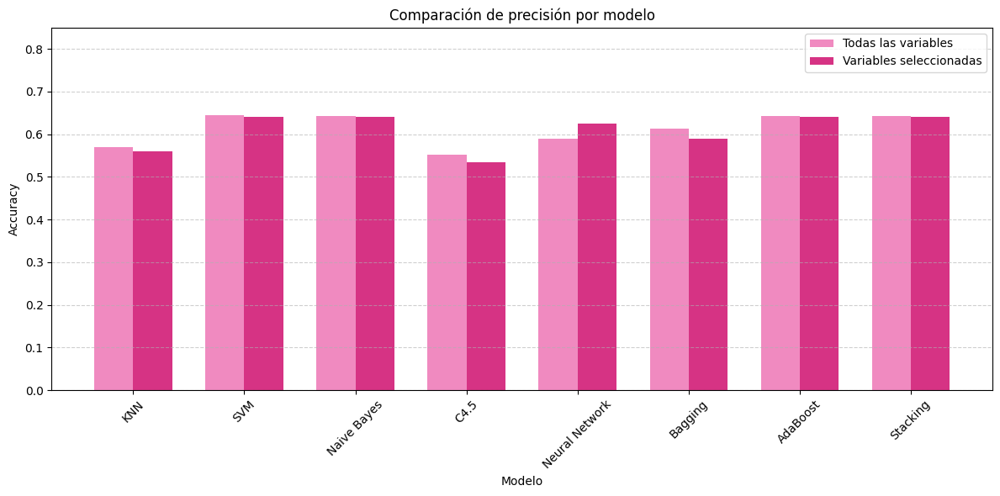

In [225]:
# Preparar datos
modelos = list(accuracy_scores.keys())
todas_vals = [accuracy_scores[m] for m in modelos]
reducidas_vals = [accuracy_scores_red[m] for m in modelos]

# Crear gráfico
plt.figure(figsize=(12, 6))
bar_width = 0.35
index = range(len(modelos))

plt.bar(index, todas_vals, bar_width, label='Todas las variables', color='#F08AC0')
plt.bar([i + bar_width for i in index], reducidas_vals, bar_width, label='Variables seleccionadas', color='#D63384')

plt.xlabel('Modelo')
plt.ylabel('Accuracy')
plt.title('Comparación de precisión por modelo')
plt.xticks([i + bar_width / 2 for i in index], modelos, rotation=45)
plt.ylim(0.0, 0.85)
plt.legend()
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.6)

plt.show()

In [226]:
#Método de validación cruzada
#Vamos a aplicar este método para comparar con lo anterior.
#El método de validación cruzada es un método para medir la precisión de forma más robusta. Es método que sustituye al paso clásico de (train/test).
#El método train/test da una única precisión (en test) es decir, tiene una única división y puede ser engañosa si el test es difícil o fácil
#El método de validación cruzada entrena y valida K-veces y devuelve el promedio en la precisión. Esto hace que el método sea más robusto y fiable

In [227]:
#Método de validación cruzada

In [228]:
from sklearn.model_selection import cross_val_score

c:\Users\mosor\Desktop\TFG_Repository\python\venv_tfg\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\mosor\Desktop\TFG_Repository\python\venv_tfg\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


📊 Accuracy promedio con TODAS las variables:
Naive Bayes    : 64.18%
AdaBoost       : 64.18%
Stacking       : 64.18%
SVM            : 64.17%
Bagging        : 60.17%
Neural Network : 58.56%
KNN            : 56.65%
C4.5           : 54.07%


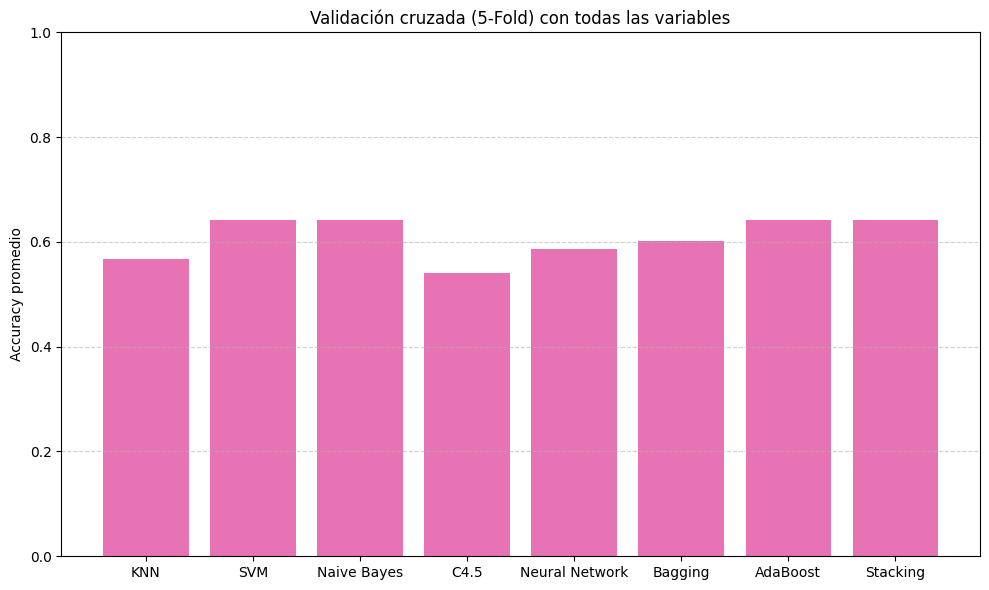

In [229]:
# Calcular validación cruzada
accuracy_todas = {}
for name, model in models.items():
    scores = cross_val_score(model, X, y, cv=5)
    accuracy_todas[name] = scores.mean()

# Mostrar resultados ordenados
print("📊 Accuracy promedio con TODAS las variables:")
for modelo, acc in sorted(accuracy_todas.items(), key=lambda x: x[1], reverse=True):
    print(f"{modelo:15s}: {acc * 100:.2f}%")

# (Opcional) Graficar resultados
modelos = list(accuracy_todas.keys())
valores = [accuracy_todas[m] for m in modelos]

plt.figure(figsize=(10, 6))
plt.bar(modelos, valores, color='#E773B5')
plt.ylabel("Accuracy promedio")
plt.title("Validación cruzada (5-Fold) con todas las variables")
plt.ylim(0.0, 1.0)
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

📊 Accuracy promedio con las variables seleccionadas:
SVM            : 64.18%
Naive Bayes    : 64.18%
AdaBoost       : 64.18%
Stacking       : 64.18%
Neural Network : 62.49%
Bagging        : 60.55%
KNN            : 56.66%
C4.5           : 54.26%


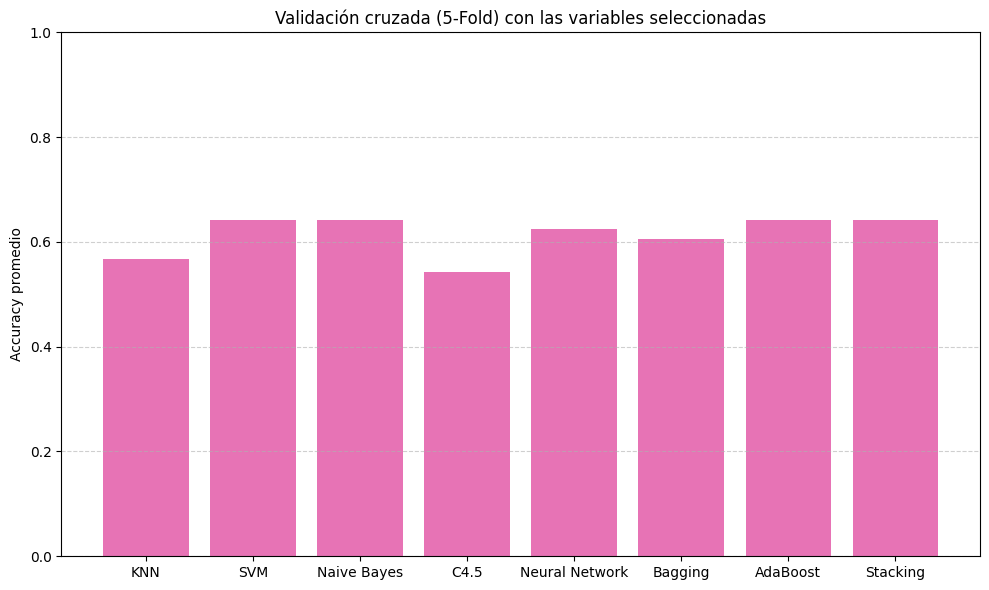

In [230]:
# Calcular validación cruzada
accuracy_todas_red = {}
for name, model in models.items():
    scores = cross_val_score(model, A, b, cv=5)
    accuracy_todas_red[name] = scores.mean()

# Mostrar resultados ordenados
print("📊 Accuracy promedio con las variables seleccionadas:")
for modelo, acc in sorted(accuracy_todas_red.items(), key=lambda x: x[1], reverse=True):
    print(f"{modelo:15s}: {acc * 100:.2f}%")

# (Opcional) Graficar resultados
modelos = list(accuracy_todas_red.keys())
valores = [accuracy_todas_red[m] for m in modelos]

plt.figure(figsize=(10, 6))
plt.bar(modelos, valores, color='#E773B5')
plt.ylabel("Accuracy promedio")
plt.title("Validación cruzada (5-Fold) con las variables seleccionadas")
plt.ylim(0.0, 1.0)
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

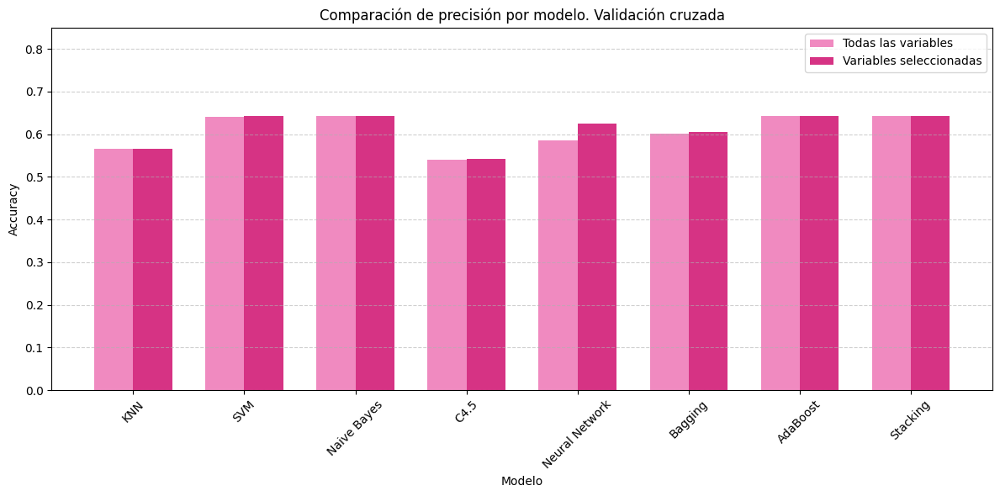

In [231]:
# Preparar datos
modelos = list(accuracy_todas.keys())
todas_vals = [accuracy_todas[m] for m in modelos]
reducidas_vals = [accuracy_todas_red[m] for m in modelos]

# Crear gráfico
plt.figure(figsize=(12, 6))
bar_width = 0.35
index = range(len(modelos))

plt.bar(index, todas_vals, bar_width, label='Todas las variables', color='#F08AC0')
plt.bar([i + bar_width for i in index], reducidas_vals, bar_width, label='Variables seleccionadas', color='#D63384')

plt.xlabel('Modelo')
plt.ylabel('Accuracy')
plt.title('Comparación de precisión por modelo. Validación cruzada')
plt.xticks([i + bar_width / 2 for i in index], modelos, rotation=45)
plt.ylim(0.0, 0.85)
plt.legend()
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.6)

plt.show()

In [232]:
#OBSERVACIONES

In [233]:
#Gráfica de comparación de precisión por modelo:Train/Test vs Validación Cruzada

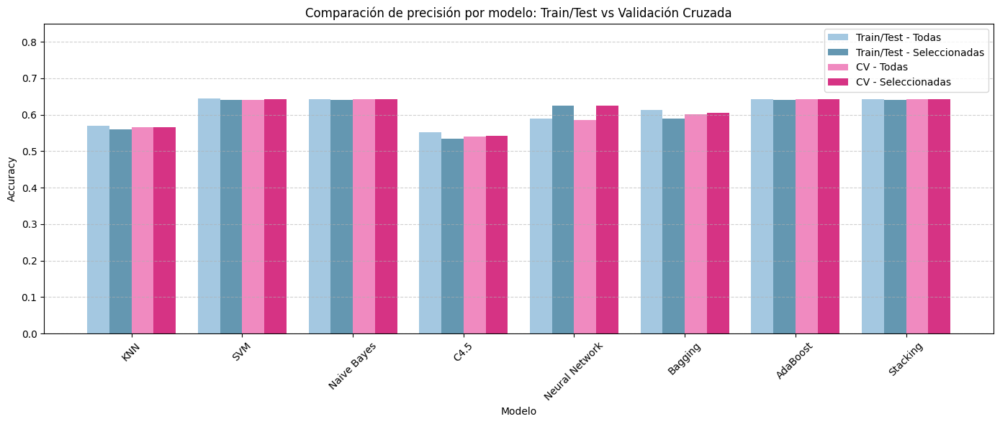

In [234]:
modelos = list(accuracy_scores.keys())
x = range(len(modelos))
bar_width = 0.2

# Crear gráfico combinado
plt.figure(figsize=(14, 6))

# Train/test
plt.bar([i - 1.5 * bar_width for i in x], [accuracy_scores[m] for m in modelos],
        width=bar_width, label='Train/Test - Todas', color='#A4C8E1')

plt.bar([i - 0.5 * bar_width for i in x], [accuracy_scores_red[m] for m in modelos],
        width=bar_width, label='Train/Test - Seleccionadas', color='#6497B1')

# Validación cruzada
plt.bar([i + 0.5 * bar_width for i in x], [accuracy_todas[m] for m in modelos],
        width=bar_width, label='CV - Todas', color='#F08AC0')

plt.bar([i + 1.5 * bar_width for i in x], [accuracy_todas_red[m] for m in modelos],
        width=bar_width, label='CV - Seleccionadas', color='#D63384')

# Ajustes
plt.xlabel('Modelo')
plt.ylabel('Accuracy')
plt.title('Comparación de precisión por modelo: Train/Test vs Validación Cruzada')
plt.xticks(x, modelos, rotation=45)
plt.ylim(0.0, 0.85)
plt.legend()
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.show()